<div style="text-align: center;">
    <h2>UNIVERSIDAD DE MONTERREY</h2>



<img src="./Logo_UDEM.jpg" width="20%">

### Vicerrectoría de Educación Superior
### División de Ingeniería y Tecnologías
### Inteligencia Artificial II
### Dr. Andrés Hernández Gutiérrez
### Clasificacion Binaria de Enfermedades del Corazon Usando un Modelo "PERCEPTRÓN"


Joel Enrique Díaz Villanueva 594847 IMT

José Miguel González Zaragoza 631145 IRSI

David Sebastián Izaguirre Garza 583840 IRSI


</div>

In [1]:
import os
from datetime import datetime
import pandas as pd # Proporciona estructuras de datos y herramientas para el análisis eficiente de datos tabulares, series temporales y matrices etiquetadas o no etiquetadas.
import plotly.express as px # Permite crear diversas figuras a la vez.
import seaborn as sns
import matplotlib.pyplot as plt # Está diseñada para crear gráficos y visualizaciones interactivas de datos, por ejemplo, para trazar las curvas de aprendizaje y evaluar el proceso de entrenamiento.
import numpy as np # Se utiliza para crear arreglos multidimensionales y realizar operaciones matemáticas, lógicas y de álgebra lineal, además de la generación de números aleatorios.
import tensorflow as tf #  Librería desarrollada por Google, es de las más utilizadas para diseñar, entrenar, validar y probar el desarrollo de una red neuronal.
from sklearn.model_selection import train_test_split # Esta biblioteca proporciona el método train_test_split para dividir el conjunto de datos inicial en los conjuntos de entrenamiento y validación.
from sklearn.preprocessing import StandardScaler # Estándariza las características eliminando la media y escalando a una varianza unitaria. (z = (x - u) / s)
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay, classification_report # Se utiliza para gráficar en una matriz una comparación entre los valores reales y predichos

2024-10-19 14:55:20.611429: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-10-19 14:55:20.616955: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-10-19 14:55:20.633083: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-19 14:55:20.659633: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-19 14:55:20.666686: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-19 14:55:20.685876: I tensorflow/core/platform/cpu_feature_gu

In [2]:
data = pd.read_csv('Skyserver_SQL2_27_2018 6_51_39 PM.csv')
df = data
df

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
0,1.237650e+18,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,752,301,4,267,3.722360e+18,STAR,-0.000009,3306,54922,491
1,1.237650e+18,183.598370,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,752,301,4,267,3.638140e+17,STAR,-0.000055,323,51615,541
2,1.237650e+18,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,752,301,4,268,3.232740e+17,GALAXY,0.123111,287,52023,513
3,1.237650e+18,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,752,301,4,269,3.722370e+18,STAR,-0.000111,3306,54922,510
4,1.237650e+18,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,752,301,4,269,3.722370e+18,STAR,0.000590,3306,54922,512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.237650e+18,131.316413,51.539547,18.81777,17.47053,16.91508,16.68305,16.50570,1345,301,3,161,5.033450e+17,GALAXY,0.027583,447,51877,246
9996,1.237650e+18,131.306083,51.671341,18.27255,17.43849,17.07692,16.71661,16.69897,1345,301,3,162,5.033400e+17,GALAXY,0.117772,447,51877,228
9997,1.237650e+18,131.552562,51.666986,18.75818,17.77784,17.51872,17.43302,17.42048,1345,301,3,162,8.222620e+18,STAR,-0.000402,7303,57013,622
9998,1.237650e+18,131.477151,51.753068,18.88287,17.91068,17.53152,17.36284,17.13988,1345,301,3,163,5.033400e+17,GALAXY,0.014019,447,51877,229


In [3]:
df['class'].value_counts()

class
GALAXY    4998
STAR      4152
QSO        850
Name: count, dtype: int64

In [4]:
df['class'] = df['class'].replace({'GALAXY': 0, 'STAR': 1, 'QSO': 2})
df

/tmp/ipykernel_15032/3166445850.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['class'] = df['class'].replace({'GALAXY': 0, 'STAR': 1, 'QSO': 2})


,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
0,1.237650e+18,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,752,301,4,267,3.722360e+18,1,-0.000009,3306,54922,491
1,1.237650e+18,183.598370,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,752,301,4,267,3.638140e+17,1,-0.000055,323,51615,541
2,1.237650e+18,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,752,301,4,268,3.232740e+17,0,0.123111,287,52023,513
3,1.237650e+18,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,752,301,4,269,3.722370e+18,1,-0.000111,3306,54922,510
4,1.237650e+18,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,752,301,4,269,3.722370e+18,1,0.000590,3306,54922,512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.237650e+18,131.316413,51.539547,18.81777,17.47053,16.91508,16.68305,16.50570,1345,301,3,161,5.033450e+17,0,0.027583,447,51877,246
9996,1.237650e+18,131.306083,51.671341,18.27255,17.43849,17.07692,16.71661,16.69897,1345,301,3,162,5.033400e+17,0,0.117772,447,51877,228
9997,1.237650e+18,131.552562,51.666986,18.75818,17.77784,17.51872,17.43302,17.42048,1345,301,3,162,8.222620e+18,1,-0.000402,7303,57013,622
9998,1.237650e+18,131.477151,51.753068,18.88287,17.91068,17.53152,17.36284,17.13988,1345,301,3,163,5.033400e+17,0,0.014019,447,51877,229


In [5]:
df[df.columns] = df[df.columns].apply(pd.to_numeric, errors='coerce') # Se convierte todo el dataframe a valores numéricos para garantizar que no haya problemas con los cálculos posteriores.
df = df.dropna() # Se elimina cualquier fila que contenga valores NaN.
df.describe().T

,count,mean,std,min,25%,50%,75%,max
objid,10000.0,1.237650e+18,0.000000e+00,1.237650e+18,1.237650e+18,1.237650e+18,1.237650e+18,1.237650e+18
ra,10000.0,1.755300e+02,4.778344e+01,8.235100e+00,1.573709e+02,1.803945e+02,2.015473e+02,2.608844e+02
dec,10000.0,1.483615e+01,2.521221e+01,-5.382632e+00,-5.390350e-01,4.041660e-01,3.564940e+01,6.854227e+01
u,10000.0,1.861936e+01,8.286560e-01,1.298897e+01,1.817803e+01,1.885309e+01,1.925923e+01,1.959990e+01
g,10000.0,1.737193e+01,9.454572e-01,1.279955e+01,1.681510e+01,1.749513e+01,1.801015e+01,1.991897e+01
r,10000.0,1.684096e+01,1.067764e+00,1.243160e+01,1.617333e+01,1.685877e+01,1.751267e+01,2.480204e+01
i,10000.0,1.658358e+01,1.141805e+00,1.194721e+01,1.585370e+01,1.655499e+01,1.725855e+01,2.817963e+01
z,10000.0,1.642283e+01,1.203188e+00,1.161041e+01,1.561829e+01,1.638994e+01,1.714145e+01,2.283306e+01
run,10000.0,9.810348e+02,2.733050e+02,3.080000e+02,7.520000e+02,7.560000e+02,1.331000e+03,1.412000e+03
rerun,10000.0,3.010000e+02,0.000000e+00,3.010000e+02,3.010000e+02,3.010000e+02,3.010000e+02,3.010000e+02


In [6]:
df['objid'].value_counts()

objid
1.237650e+18    10000
Name: count, dtype: int64

In [7]:
df['rerun'].value_counts()

rerun
301    10000
Name: count, dtype: int64

In [8]:
df = df.drop('objid', axis=1)
df = df.drop('rerun', axis=1)
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ra,10000.0,1.755300e+02,4.778344e+01,8.235100e+00,1.573709e+02,1.803945e+02,2.015473e+02,2.608844e+02
dec,10000.0,1.483615e+01,2.521221e+01,-5.382632e+00,-5.390350e-01,4.041660e-01,3.564940e+01,6.854227e+01
u,10000.0,1.861936e+01,8.286560e-01,1.298897e+01,1.817803e+01,1.885309e+01,1.925923e+01,1.959990e+01
g,10000.0,1.737193e+01,9.454572e-01,1.279955e+01,1.681510e+01,1.749513e+01,1.801015e+01,1.991897e+01
r,10000.0,1.684096e+01,1.067764e+00,1.243160e+01,1.617333e+01,1.685877e+01,1.751267e+01,2.480204e+01
i,10000.0,1.658358e+01,1.141805e+00,1.194721e+01,1.585370e+01,1.655499e+01,1.725855e+01,2.817963e+01
z,10000.0,1.642283e+01,1.203188e+00,1.161041e+01,1.561829e+01,1.638994e+01,1.714145e+01,2.283306e+01
run,10000.0,9.810348e+02,2.733050e+02,3.080000e+02,7.520000e+02,7.560000e+02,1.331000e+03,1.412000e+03
camcol,10000.0,3.648700e+00,1.666183e+00,1.000000e+00,2.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00
field,10000.0,3.023801e+02,1.625778e+02,1.100000e+01,1.840000e+02,2.990000e+02,4.140000e+02,7.680000e+02


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 16 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ra         10000 non-null  float64
 1   dec        10000 non-null  float64
 2   u          10000 non-null  float64
 3   g          10000 non-null  float64
 4   r          10000 non-null  float64
 5   i          10000 non-null  float64
 6   z          10000 non-null  float64
 7   run        10000 non-null  int64  
 8   camcol     10000 non-null  int64  
 9   field      10000 non-null  int64  
 10  specobjid  10000 non-null  float64
 11  class      10000 non-null  int64  
 12  redshift   10000 non-null  float64
 13  plate      10000 non-null  int64  
 14  mjd        10000 non-null  int64  
 15  fiberid    10000 non-null  int64  
dtypes: float64(9), int64(7)
memory usage: 1.2 MB


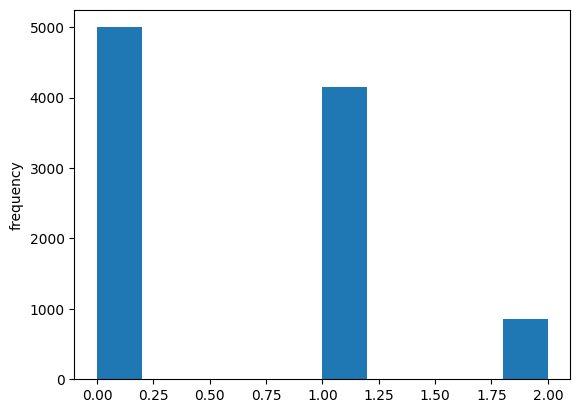

In [10]:
plt.hist(df['class']); # Se crea un histograma de la columna occupancy del dataframe.
plt.ylabel('frequency'); # Se etiqueta el eje Y para mostrar que representa la frecuencia de las clases.

In [11]:
# Scatter plot matrix
features = df.drop(["class"], axis=1).columns # Se elimina la columna Heart Disease.
fig = px.scatter_matrix(data_frame=df, # Se crea una matriz de gráficos de dispersión con los datos del DataFrame.
                        dimensions=features, # Se especifican las columnas a incluir en el gráfico, sin Heart Disease.
                        color=df['class']) # Se utiliza la columna 'Occupancy' para colorear los puntos en función de la ocupación.
fig.update_traces(marker = dict(size=4), diagonal_visible=False, showupperhalf=False) # Se actualiza el tamaño de los marcadores, se ocultan las diagonales y se muestra solo la mitad inferior de la matriz.
fig.update_layout(width=900, height=600, title="Galaxy/Star/Quasar Classification", font_size=9) # Se ajustan las dimensiones del gráfico, se personaliza el título y el tamaño de la fuente del gráfico.
fig.show() # Se muestra la matriz con los gráficos de dispersión.

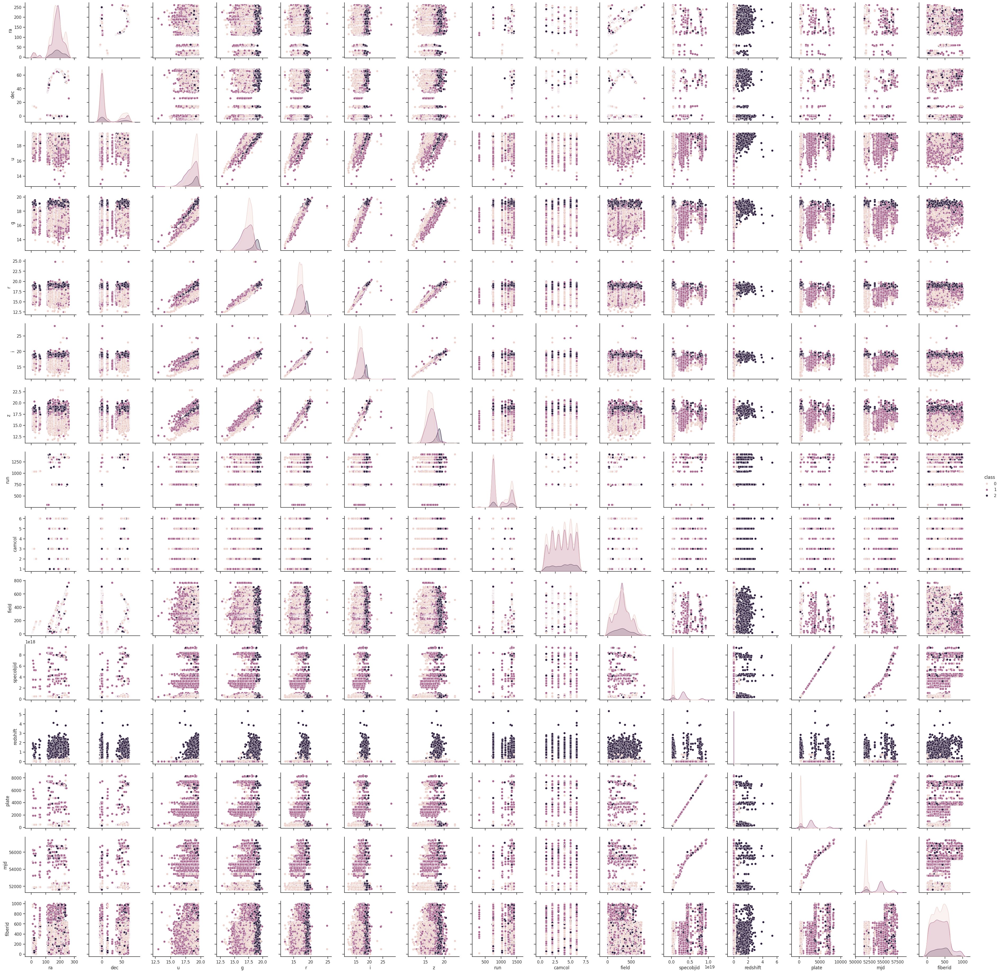

In [12]:
sns.set_theme(style="ticks") # Se estable el estilo del gráfico de pares.
sns.pairplot(df, hue="class"); # Se crea un gráfico de pares para visualizar la relación entre todas las variables del dataframe.

In [13]:
X = df.drop(["class"], axis=1) 
y = df['class']  

scaler = StandardScaler()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True)

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [14]:
# Define the model

def get_model():
    model = tf.keras.Sequential([  # Se crea un modelo secuencial de Keras.
        tf.keras.layers.InputLayer(shape=(len(X.columns),)), # Se establecen 15 entradas 
        
        tf.keras.layers.Dense(16),                  # Primera capa oculta con 16 neuronas, batch normalization y función de activación relu.
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Activation('relu'),
        
        tf.keras.layers.Dense(16),                  # Segunda capa oculta con 16 neuronas, batch normalization, función de activación relu y un Dropout del 20%.
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Activation('relu'),
        tf.keras.layers.Dropout(0.2),
        
        tf.keras.layers.Dense(3, activation='linear' ) # Capa de salida con 3 neuronas, (Clase 0, Clase 1, Clase 2).
    ])
    return model

model = get_model() # Se obtiene el modelo.

Para la estructura del modelo, se probó con 2 a 3 capas ocultas con diferentes cantidades de neuronas entre sí, obteniendo los mejores resultados con esta configuración. Asimismo, se optó por incluir Dropout en la última capa oculta, ya que puede capturar características relevantes. Finalmente, se decidió utilizar la función de activación 'linear' en la capa de salida. De acuerdo al profesor Andrew Ng de la Universidad de Stanford, una forma de implementar la función de activación 'softmax' de manera numéricamente más eficiente es incluir 'SparseCategoricalCrossentropy(from_logits=True)' en la función de pérdida, para después utilizar la función de activación 'linear' en la capa de salida.

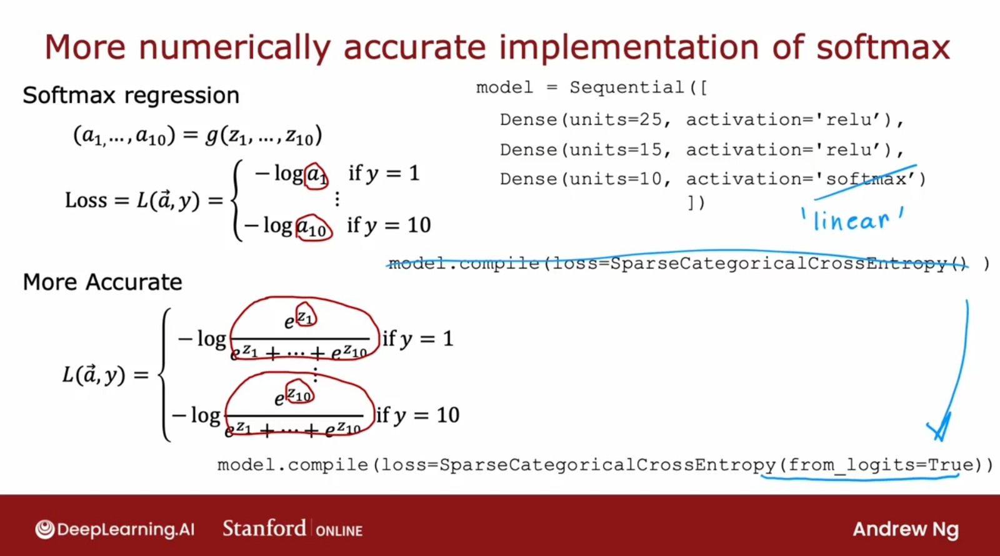

In [15]:
model.summary() # Se devuelve un análisis del modelo.

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 16)             │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 16)             │           272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 707 (2.76 KB)

 Trainable params: 643 (2.51 KB)

 Non-trainable params: 64 (256.00 B)

Se obsera un resumen del modelo, donde hay un total de 707 parámetros, los cuales 643 son entrenables y el resto 64 no lo son, teniendo el modelo un peso total de 2.76 KB. Como se mencionó anteriormente, se hicieron pruebas con un mayor número de capas y neuronas entre estás, sin embargo, se optó por utilizar este modelo debido a que pesaba menos, algo a tener en cuenta al momento de querer importarlo a un sistema embebido.

In [16]:
loss_function = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

from tensorflow.keras.optimizers import Adam


model.compile(optimizer = Adam(learning_rate=0.001), loss=loss_function, metrics=['accuracy'])

Se establece la función de pérdida SparseCategoricalCrossentropy, la más utilizada en clasificación multiclase, con lo anteriormente mencionado de from_logits=True, para hacerlo númericamente más estable.

In [17]:
from keras.callbacks import EarlyStopping

# Definir el callback de Early Stopping
early_stopping = EarlyStopping(
    patience= 10,
    monitor='val_loss',
    min_delta=0.001,
    restore_best_weights=True,
)

# Entrenar el modelo con el callback que minimiza el learning rate
history = model.fit(
    X_train, y_train,
    epochs=200,
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stopping]  # Añadir el callback de EarlyStopping scheduler
)

Epoch 1/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.3967 - loss: 1.2073 - val_accuracy: 0.8844 - val_loss: 0.4523
Epoch 2/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8510 - loss: 0.4680 - val_accuracy: 0.8950 - val_loss: 0.3178
Epoch 3/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8884 - loss: 0.3479 - val_accuracy: 0.9025 - val_loss: 0.2731
Epoch 4/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8914 - loss: 0.3182 - val_accuracy: 0.9119 - val_loss: 0.2445
Epoch 5/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8943 - loss: 0.2940 - val_accuracy: 0.9206 - val_loss: 0.2254
Epoch 6/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9031 - loss: 0.2813 - val_accuracy: 0.9231 - val_loss: 0.2131
Epoch 7/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9027 - loss: 0.2659 - val_accuracy: 0.9306 - val_loss: 0.2066
Epoch 8/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9213 - loss: 0.2385 - val_accu

La elección de un batch size de 32 se debe a que es un valor comúnmente utilizado en el entrenamiento de redes neuronales, ya que proporciona un buen balance entre eficiencia de cómputo y uso de memoria. Además, en este proyecto, la cantidad de datos es considerablemente mayor en comparación con el primer proyecto, lo que justifica un tamaño de batch más estándar para optimizar el rendimiento.

En la época 36, se alcanzó una precisión (accuracy) del 98.19% en los datos de validación, con una pérdida (loss) de 0.0743. La implementación de EarlyStopping permitió detener el entrenamiento de manera anticipada tras 10 épocas sin mejora, agilizando el proceso y evitando sobreentrenamiento, lo que resultó en un modelo eficiente sin desperdiciar recursos de por medio.

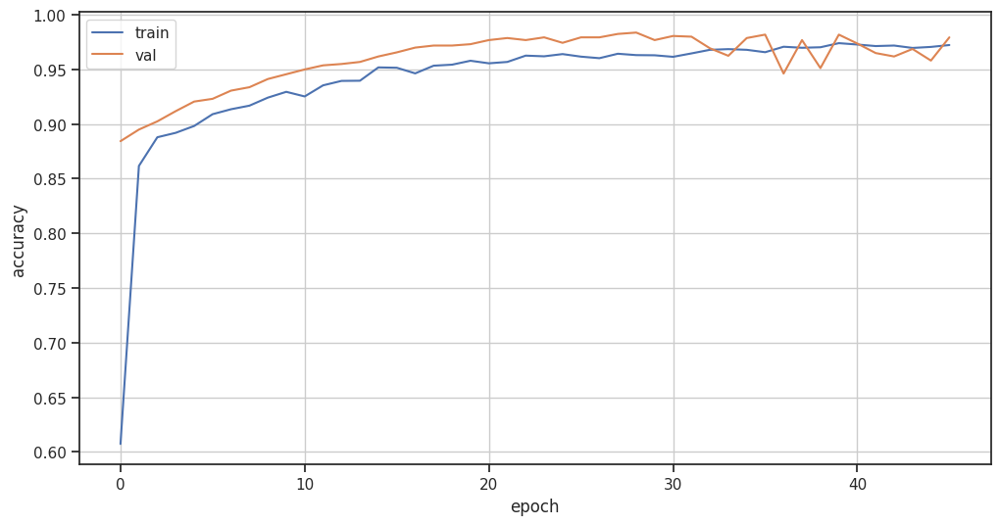

In [18]:
# Plot validation and testing accuracy
plt.figure(figsize=(12,6)) # Se establece el tamaño de la gráfica.
plt.plot(history.history['accuracy']) # Se gráfica la exactitud del modelo a través de las épocas.
plt.plot(history.history['val_accuracy']) # Se gráfica la exactitud del modelo con los datos de validación del entrenamiento a través de las épocas.
plt.xlabel('epoch') # El eje x corresponde a las épocas.
plt.ylabel('accuracy') # El eje y corresponde a las exactitud.
plt.legend(['train', 'val']) # Se añade una leyenda para distinguir entre entrenamiento y validación.
plt.grid(); # Se añade una cuadrícula a la gráfica para mejorar la legibilidad.

En esta gráfica se puede observar como la inclusión del EarlyStopping evita un sobreentrenamiento, donde en la última época se logró llegar a una precisión nuevamente del 98% con los datos de validación, sin embargo, con una pérdida un poco mayor (0.0804), con lo que se pudo evitar este sobreentrenamiento. 

Además, con la inclusión de Batch Normalization, el modelo alcanzó rápidamente una convergencia, mejorando la estabilidad y velocidad del entrenamiento, lo que permitió obtener un rendimiento óptimo en menos épocas.

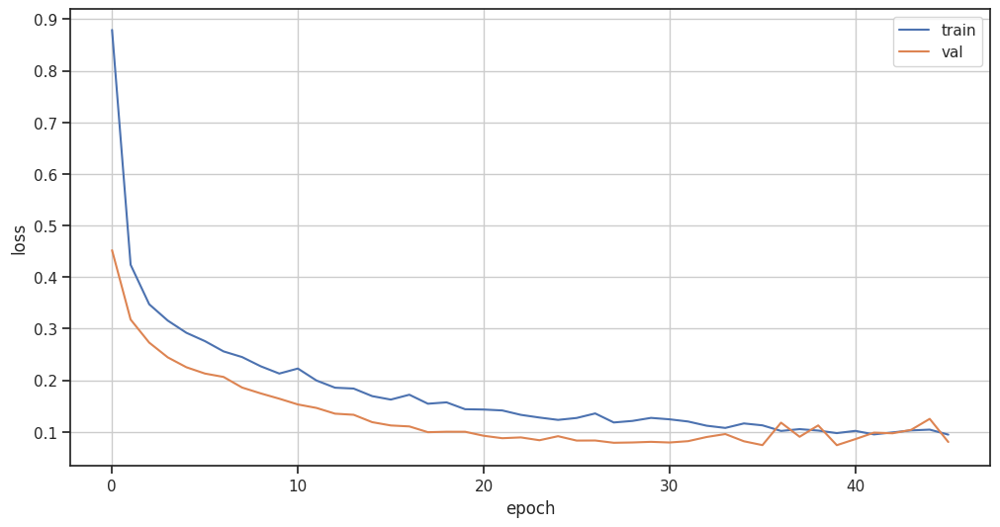

In [19]:
# Plot validation and testing loss
plt.figure(figsize=(12,6)) # Se establece el tamaño de la gráfica.
plt.plot(history.history['loss']) # Se gráfica la pérdida del conjunto de entrenamiento a lo largo de las épocas.
plt.plot(history.history['val_loss']) # Se gráfica la pérdida con los datos de validación del entrenamiento a lo largo de las épocas.
plt.xlabel('epoch') # El eje x corresponde a las épocas.
plt.ylabel('loss') # El eje y corresponde a la pérdida.
plt.legend(['train', 'val'])  # Se añade una leyenda para distinguir entre entrenamiento y validación.
plt.grid(); # Se añade una cuadrícula a la gráfica para mejorar la legibilidad.

Se observa como el época 36, alcanzó una pérdida mínima, donde además como se menciona en la gráfica anterior, con la inclusión del EarlyStopping, se logró evitar un sobreentrenamiento, donde en la última época alcanza una pérdida un poco mayor a la que se obtuvo en la época 36.

In [20]:
# Print weights
weights = model.layers[0].get_weights() # Se muestran los pesos de las entradas.
print(weights) # Se muestran los pesos.

[array([[-6.42591193e-02,  4.39445339e-02,  4.02322300e-02,
        -5.14191091e-02, -5.97222559e-02, -3.34893316e-02,
        -1.28492057e-01,  4.20841016e-02, -1.97386563e-01,
         6.04901947e-02, -1.56755328e-01, -1.47768497e-01,
        -1.42873347e-01,  1.15611702e-01, -6.61984980e-02,
        -1.87193573e-01],
       [-8.99708942e-02,  1.47745311e-01, -6.13954961e-02,
         1.38128847e-01,  3.52790430e-02,  3.00763715e-02,
        -3.79421443e-01, -1.01771921e-01,  1.70869917e-01,
        -7.51092806e-02, -2.96870679e-01, -2.62910277e-01,
        -6.17179014e-02,  1.16707250e-01,  1.42445532e-03,
        -5.40255904e-02],
       [-6.12989724e-01,  5.18815853e-02, -2.85037935e-01,
        -2.39791662e-01,  6.81819767e-02,  2.73770511e-01,
         1.68725252e-01,  3.43368836e-02, -5.19657414e-03,
         6.19418919e-02, -2.22634315e-03, -4.60454404e-01,
        -2.48111755e-01, -2.70682395e-01, -1.90058023e-01,
        -1.99814081e-01],
       [-4.56588976e-02,  5.36752641

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


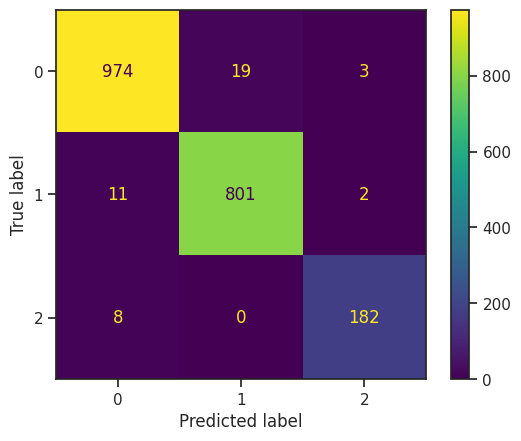

In [21]:
# Realizar las predicciones
y_probabilities = model.predict(X_test)

# Convertir las probabilidades en predicciones de clases (índices de la clase con la mayor probabilidad)
y_predictions = np.argmax(y_probabilities, axis=1)

# Calcular la matriz de confusión
c_matrix = confusion_matrix(y_true=y_test, y_pred=y_predictions)

# Mostrar la matriz de confusión
display_matrix = ConfusionMatrixDisplay(confusion_matrix=c_matrix)
display_matrix.plot() 

En los resultados obtenidos en la matriz de confusión con 2 mil datos de prueba, se observa como el modelo llegó a una precisión del 97.85% con los datos, teniendo la Clase 0 (Estrellas) una mayor catidad de falsos positivos con 22.

In [22]:
# Evaluate the model on the test data
loss, accuracy = model.evaluate(X_test, y_test) # Se evalua el modelo con los datos de prueba.
print(f"Test Accuracy: {accuracy:.4f}") # Se muestra la precisión y la pérdida.

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9738 - loss: 0.0857 
Test Accuracy: 0.9785


In [23]:
print(classification_report(y_test, y_predictions))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       996
           1       0.98      0.98      0.98       814
           2       0.97      0.96      0.97       190

    accuracy                           0.98      2000
   macro avg       0.98      0.97      0.98      2000
weighted avg       0.98      0.98      0.98      2000



In [24]:
# Definir función para obtener métricas para cada clase en una matriz de confusión 3x3
def get_performance_metrics(c_matrix):
    # Inicializar listas para almacenar las métricas por clase
    accuracy_per_class = []
    precision_per_class = []
    recall_per_class = []
    specificity_per_class = []
    f1_score_per_class = []

    # Iterar sobre cada clase (diagonal de la matriz de confusión)
    for i in range(len(c_matrix)):
        # Verdaderos Positivos (TP)
        tp = c_matrix[i, i]

        # Falsos Positivos (FP) - Columna de la clase i sin el verdadero positivo
        fp = c_matrix[:, i].sum() - tp

        # Falsos Negativos (FN) - Fila de la clase i sin el verdadero positivo
        fn = c_matrix[i, :].sum() - tp

        # Verdaderos Negativos (TN) - Todo lo demás que no está en la fila o columna de la clase i
        tn = c_matrix.sum() - (tp + fp + fn)

        # Calcular las métricas para la clase i
        accuracy = (tp + tn) / c_matrix.sum()
        precision = tp / (tp + fp) if (tp + fp) != 0 else 0
        recall = tp / (tp + fn) if (tp + fn) != 0 else 0
        specificity = tn / (tn + fp) if (tn + fp) != 0 else 0
        f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) != 0 else 0

        # Almacenar las métricas para la clase
        accuracy_per_class.append(accuracy)
        precision_per_class.append(precision)
        recall_per_class.append(recall)
        specificity_per_class.append(specificity)
        f1_score_per_class.append(f1)

    return accuracy_per_class, precision_per_class, recall_per_class, specificity_per_class, f1_score_per_class

# Obtener métricas
accuracy_per_class, precision_per_class, recall_per_class, specificity_per_class, f1_score_per_class = get_performance_metrics(c_matrix)

# Mostrar resultados
for i in range(len(c_matrix)):
    print(f"\nClase {i}:")
    print(f"Accuracy: {accuracy_per_class[i]:0.6f}")
    print(f"Precision: {precision_per_class[i]:0.6f}")
    print(f"Recall: {recall_per_class[i]:0.6f}")
    print(f"Specificity: {specificity_per_class[i]:0.6f}")
    print(f"F1-score: {f1_score_per_class[i]:0.6f}")



Clase 0:
Accuracy: 0.979500
Precision: 0.980866
Recall: 0.977912
Specificity: 0.981076
F1-score: 0.979387

Clase 1:
Accuracy: 0.984000
Precision: 0.976829
Recall: 0.984029
Specificity: 0.983980
F1-score: 0.980416

Clase 2:
Accuracy: 0.993500
Precision: 0.973262
Recall: 0.957895
Specificity: 0.997238
F1-score: 0.965517


En general, el modelo muestra un excelente rendimiento en todas las clases, con un accuracy promedio muy alto y métricas de precision, recall, y F1-score que sugieren que está funcionando bien. Sin embargo, es importante prestar atención a los niveles de recall, a comparación de las demás métricas donde se ven muy similares entre sí, en el recall de la clase 2, se ve una disminución, del 2%, lo cual también se observa que tiene un impacto en el F1-score, sin embargo, consideramos que esto no es una situación alarmante, principalmente por nuestra aplicación, pero una forma de mejorar las predicciones en la clase 2 sería obtener más datos sobre cuásares, debido a que tambén impacto el hecho de que solamente se tienen 850 muestras, mientras que las estrellas y galaxias superan las 4 mil.

In [25]:
def check_and_create_directory(directory_path):
    """
    Checks if a directory exists, and if it does not, creates it.

    This function first checks whether the given directory path exists. 
    If the directory does not exist, it attempts to create it using `os.makedirs()`. 
    If the directory exists, it simply prints a message indicating so. 
    If there is an error during directory creation, the exception is caught and an error message is displayed.

    Args:
        directory_path (str): The path of the directory to check and create if not present.

    Returns:
        None
    """

    # Check if the directory already exists
    if not os.path.exists(directory_path):
        
        try:
            # Create the directory if it does not exist
            os.makedirs(directory_path)
            print(f"Directory '{directory_path}' created.")

        except OSError as error:
            print(f"Error creating directory: {error}")
    else:
        print(f"Directory '{directory_path}' already exists.")

In [26]:
# Create a directory to store the Keras model
check_and_create_directory('models')

# Build the Keras filename
prefix = datetime.now().strftime("%Y-%m-%d-%H-%M-%S-%f")[:-4]
filename = 'project-02-team-01.keras'
path_and_filename = "".join(['models/', prefix, '-', filename])

# Save the model
model.save(path_and_filename)

Directory 'models' already exists.


In [27]:
# Load the saved neural network model. Make sure this is similar to that one shown above
new_model = tf.keras.models.load_model(path_and_filename, custom_objects=None, compile=True, safe_mode=True)
new_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 16)             │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 16)             │           272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,995 (7.80 KB)

 Trainable params: 643 (2.51 KB)

 Non-trainable params: 64 (256.00 B)

 Optimizer params: 1,288 (5.04 KB)

## Machine Learning

KNeighborsClassifier

In [28]:
from sklearn.neighbors import KNeighborsClassifier
knnClassifier = KNeighborsClassifier(n_neighbors = 6, p=1)
model2 = knnClassifier.fit(X_train, y_train)
y_pred = model2.predict(X_test)

              precision    recall  f1-score   support

           0       0.87      0.96      0.91       996
           1       0.93      0.84      0.88       814
           2       0.97      0.81      0.89       190

    accuracy                           0.90      2000
   macro avg       0.92      0.87      0.89      2000
weighted avg       0.90      0.90      0.90      2000



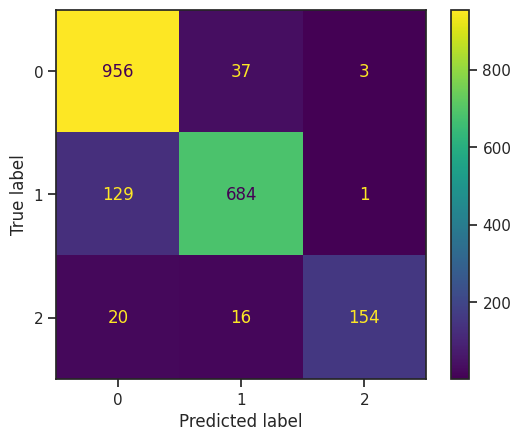

In [29]:
print(classification_report(y_test, y_pred))

c_matrix1 = confusion_matrix(y_true=y_test, y_pred=y_pred)

# Mostrar la matriz de confusión
display_matrix = ConfusionMatrixDisplay(confusion_matrix=c_matrix1)
display_matrix.plot()

In [30]:
# Obtener métricas
accuracy_per_class, precision_per_class, recall_per_class, specificity_per_class, f1_score_per_class = get_performance_metrics(c_matrix1)

# Mostrar resultados
for i in range(len(c_matrix1)):
    print(f"\nClase {i}:")
    print(f"Accuracy: {accuracy_per_class[i]:0.6f}")
    print(f"Precision: {precision_per_class[i]:0.6f}")
    print(f"Recall: {recall_per_class[i]:0.6f}")
    print(f"Specificity: {specificity_per_class[i]:0.6f}")
    print(f"F1-score: {f1_score_per_class[i]:0.6f}")



Clase 0:
Accuracy: 0.905500
Precision: 0.865158
Recall: 0.959839
Specificity: 0.851594
F1-score: 0.910043

Clase 1:
Accuracy: 0.908500
Precision: 0.928087
Recall: 0.840295
Specificity: 0.955312
F1-score: 0.882012

Clase 2:
Accuracy: 0.980000
Precision: 0.974684
Recall: 0.810526
Specificity: 0.997790
F1-score: 0.885057


Support Vector Classifier

In [31]:
from sklearn.svm import SVC
model3 = SVC(kernel='linear').fit(X_train, y_train)
y_pred2 = model3.predict(X_test)

              precision    recall  f1-score   support

           0       0.99      0.97      0.98       996
           1       0.97      0.99      0.98       814
           2       0.98      0.98      0.98       190

    accuracy                           0.98      2000
   macro avg       0.98      0.98      0.98      2000
weighted avg       0.98      0.98      0.98      2000



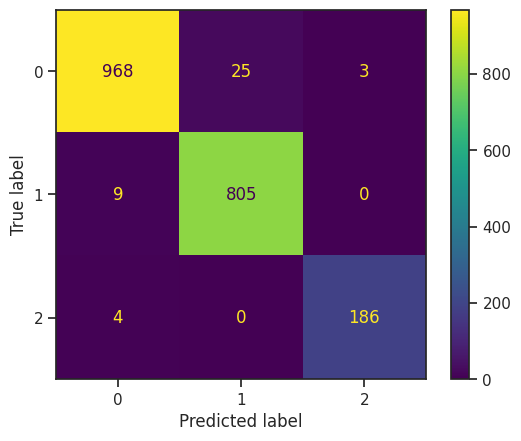

In [32]:
print(classification_report(y_test, y_pred2))

c_matrix2 = confusion_matrix(y_true=y_test, y_pred=y_pred2)

# Mostrar la matriz de confusión
display_matrix = ConfusionMatrixDisplay(confusion_matrix=c_matrix2)
display_matrix.plot()

In [33]:
# Obtener métricas
accuracy_per_class, precision_per_class, recall_per_class, specificity_per_class, f1_score_per_class = get_performance_metrics(c_matrix2)

# Mostrar resultados
for i in range(len(c_matrix2)):
    print(f"\nClase {i}:")
    print(f"Accuracy: {accuracy_per_class[i]:0.6f}")
    print(f"Precision: {precision_per_class[i]:0.6f}")
    print(f"Recall: {recall_per_class[i]:0.6f}")
    print(f"Specificity: {specificity_per_class[i]:0.6f}")
    print(f"F1-score: {f1_score_per_class[i]:0.6f}")


Clase 0:
Accuracy: 0.979500
Precision: 0.986748
Recall: 0.971888
Specificity: 0.987052
F1-score: 0.979262

Clase 1:
Accuracy: 0.983000
Precision: 0.969880
Recall: 0.988943
Specificity: 0.978921
F1-score: 0.979319

Clase 2:
Accuracy: 0.996500
Precision: 0.984127
Recall: 0.978947
Specificity: 0.998343
F1-score: 0.981530


Comparando el modelo de red neuronal, con estos clasificadores de machine learning, se observa como el modelo FNN supera ampliamante al clasificador KNeighbors, sin embargo, no se puede decir lo mismo al compararlo con el SVC, donde este obtuvo mejores resultados en la Clase 1 y 2, con una mayor cantidad de predicciones acertadas.

# Conclusión

Durante la realización de este proyecto, se aplicó un modelo de redes neuronales para una clasificación multiclase, compararandolo con otros dos modelos de machine learning. En el caso de las redes neuronales, se pudo observar como el modelo llego a obtener resultados excelentes, sin embargo, al compararlo con los modelos de machine learning, se observa como con el de SVC, logró resultados igual de buenos, teniendo incluso mejores resultados en la Clase 1 y 2, (Galaxia y Cuásar), teniendo una mayor cantidad de predicciones acertadas en la matriz de confusión, sin embargo, este tuvo una mayor cantidad de falsos positivos (28) en la Clase 1, a comparación del modelo FNN (22).

# Referencias

- Sloan Digital Sky Survey DR14. (2018). Kaggle. https://www.kaggle.com/datasets/lucidlenn/sloan-digital-sky-survey/data
- My Course. (2024). [Advanced Learning Algorithms] 25.Improved implementation of softmax [Video]. YouTube. https://www.youtube.com/watch?v=iTa37-xf1_k 
- Scikit-learn. (n.d.). KNeighborsClassifier. Scikit-learn. https://scikit-learn.org/dev/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
- Scikit-learn. (n.d.). 1.4. Support vector machines. https://scikit-learn.org/1.5/modules/svm.html
- Scikit-learn. (n.d.). SVC. https://scikit-learn.org/dev/modules/generated/sklearn.svm.SVC.html